# 🧑‍💻 U-Net Background Remover (Built from Scratch)

A complete end-to-end Machine Learning pipeline for human image matting (background removal). Instead of relying on pre-trained backbones (like ResNet) or out-of-the-box APIs, this project features a **fully custom Residual U-Net built mathematically from scratch in PyTorch**, trained on a highly constrained dataset (~2.6k images).

The goal of this project was to demonstrate core Deep Learning fundamentals: custom architecture design, ablation studies, diagnosing dataset bias, hypothesis testing, and engineering a robust production inference pipeline.

In [3]:
import os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

import torch
from torch import nn
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from torchvision.transforms import ToTensor, InterpolationMode
import albumentations as A
from albumentations.pytorch import ToTensorV2

from dataset import HumanSegmentationDataset
from model import BackgroundRemoval
from loss import BCEDiceLoss, FocalDiceLoss
from utils import train_step, val_step, evaluate_thresholds, visualize_predictions, plot_training_curves, postprocess_mask

In [5]:
DATASET_ROOT = "./data/supervisely_person_clean_2667_img"
CSV_ROOT = "./data"

try:
    os.listdir(DATASET_ROOT)
except FileNotFoundError:
    print(f"Dataset root {DATASET_ROOT} not found.")

In [40]:
IMAGE_SIZE = (256, 256)

image_transform = transforms.Compose([
    transforms.Resize(
    size=IMAGE_SIZE,
    interpolation=InterpolationMode.BILINEAR
    ),
    ToTensor(),
])

mask_transform = transforms.Compose([
    transforms.Resize(
    size=IMAGE_SIZE,
    interpolation=InterpolationMode.NEAREST
    ),
    ToTensor(),
])

In [8]:
IMAGE_SIZE = (384, 384)

# Training transforms WITH Data Augmentation
train_transform = A.Compose([
    A.Resize(height=384, width=384),
    
    # 1. SPATIAL: Change the physical orientation
    A.HorizontalFlip(p=0.5),
    A.Affine(scale=(0.8, 1.2), translate_percent=(-0.1, 0.1), rotate=(-15, 15), p=0.5),
    
    # -------------------------------------------------------------
    # 2. DESTROY THE BLUR SHORTCUT (Fixes the detailed background issue)
    # -------------------------------------------------------------
    A.OneOf([
        A.GaussianBlur(blur_limit=(3, 7), p=1.0), # Blurs the whole image (hides sharp edges)
        A.MotionBlur(blur_limit=(3, 7), p=1.0),
        A.Sharpen(alpha=(0.2, 0.5), lightness=(0.5, 1.0), p=1.0), # Makes the background artificially sharp!
    ], p=0.4), # Apply one of these 40% of the time
    
    # Add noise to disrupt smooth background gradients
    A.GaussNoise(p=0.3),

    # -------------------------------------------------------------
    # 3. DESTROY THE LIGHTING SHORTCUT (Fixes the bright background issue)
    # -------------------------------------------------------------
    A.OneOf([
        A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=1.0),
        A.RandomGamma(gamma_limit=(80, 120), p=1.0),
        A.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.1, p=1.0),
    ], p=0.5),
    
    # -------------------------------------------------------------
    # 4. DESTROY TEXTURE RELIANCE (Forces it to learn the human shape)
    # -------------------------------------------------------------
    A.CoarseDropout(
        num_holes_range=(2, 6),        
        hole_height_range=(16, 48),    
        hole_width_range=(16, 48),     
        fill=0,                        # Drops black boxes on the image
        fill_mask=None,                # <--- DO NOT touch the ground-truth mask
        p=0.4
    ),
    
    ToTensorV2(),
])

# Validation/Test transforms WITHOUT Augmentation (Only resize and to tensor)
val_transform = A.Compose([
    A.Resize(height=IMAGE_SIZE[0], width=IMAGE_SIZE[1]),
    ToTensorV2(),
])

In [9]:
csv_path = os.path.join(
    CSV_ROOT,
    "df.csv"
)
df = pd.read_csv(csv_path)


dataset = HumanSegmentationDataset(df, DATASET_ROOT, val_transform)


In [10]:
image, mask = dataset[3]

print(image.shape)
print(mask.shape)
print(np.unique(np.array(mask)))

torch.Size([3, 384, 384])
torch.Size([1, 384, 384])
[0. 1.]


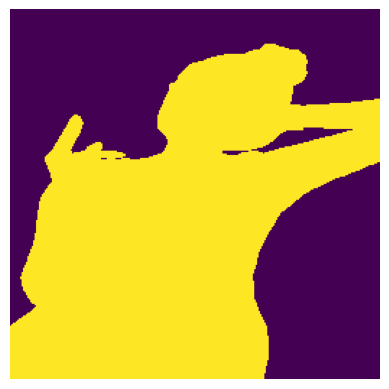

In [7]:
plt.imshow(mask.squeeze())
plt.axis("off")
plt.show()

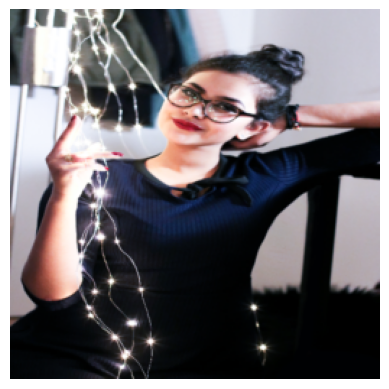

In [8]:
plt.imshow(image.permute(1, 2, 0).numpy())
plt.axis("off")
plt.show()

In [9]:
csv_path = os.path.join(
    CSV_ROOT,
    "df.csv"
)
df = pd.read_csv(csv_path)

train_df, temp_df = train_test_split(df, test_size=0.20, random_state=42)

val_df, test_df = train_test_split(temp_df, test_size=0.50, random_state=42)

#Reset the index so iloc[] works correctly in Dataset class
train_df = train_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)


In [10]:
train_dataset = HumanSegmentationDataset(train_df, DATASET_ROOT, train_transform)
val_dataset = HumanSegmentationDataset(val_df, DATASET_ROOT, val_transform)
test_dataset = HumanSegmentationDataset(test_df, DATASET_ROOT, val_transform)

In [11]:
train_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=16, shuffle=False)
test_dataloader = DataLoader(test_dataset, batch_size=16, shuffle=False)

In [12]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## 📊 The Ablation Study: An Engineering Journey

Training a model from scratch on just 2,600 images is incredibly difficult. Standard convolutions lose high-frequency details, and standard loss functions ignore fine structures like hair. 

To achieve production-level boundaries, I conducted a strict ablation study, making incremental architectural and mathematical improvements.

### Baseline U-Net

In [15]:
baseline_model = BackgroundRemoval().to(device)

criterion = nn.BCEWithLogitsLoss()

optimizer = torch.optim.Adam(
    baseline_model.parameters(),
    lr=1e-3
)

In [ ]:
train_losses = []
val_losses = []
epochs = 25
best_iou = 0

for epoch in range(epochs):
    print(f"Epoch: {epoch+1}: ")
    train_loss = train_step(baseline_model, train_dataloader, criterion, optimizer, device)

    val_loss, val_iou, val_dice = val_step(baseline_model, val_dataloader, criterion, device)


    train_losses.append(train_loss)
    val_losses.append(val_loss)

    if val_iou > best_iou:
        best_iou = val_iou
        torch.save(
            {
                "epoch": epoch + 1,
                "model_state_dict": baseline_model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "train_losses": train_losses,
                "val_losses": val_losses,
                "val_iou": val_iou,
                "val_dice": val_dice,
            },
            "baseline_model.pth",
        )



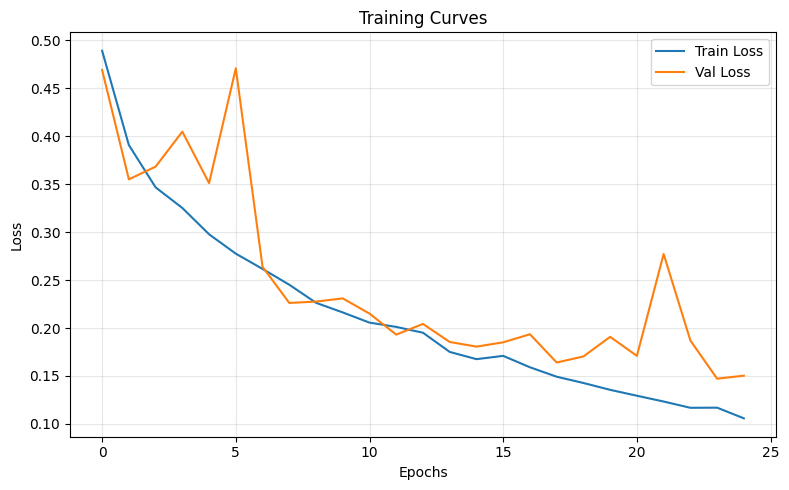

In [21]:
plot_training_curves("models/baseline_model.pth")

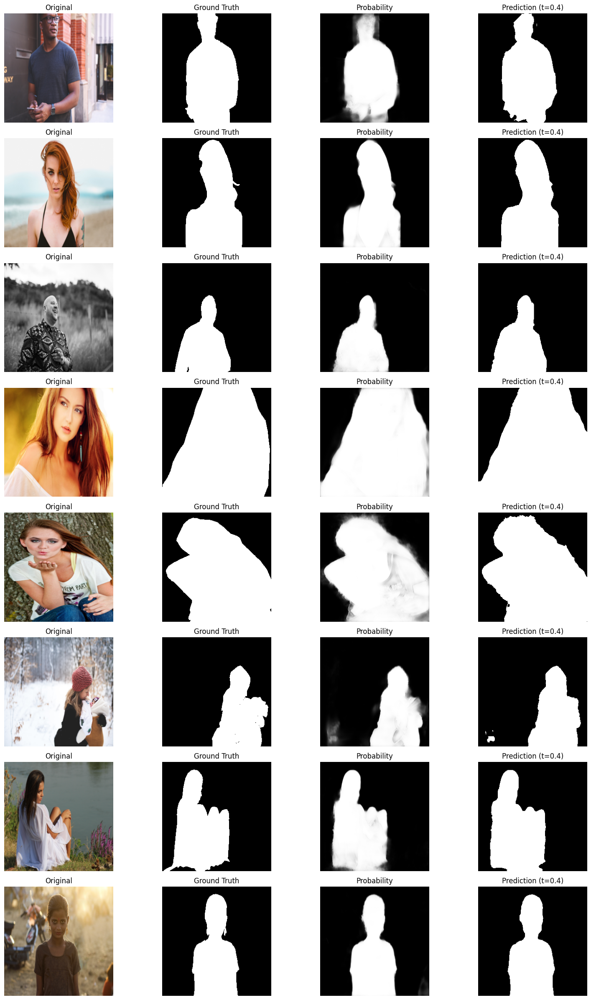

In [43]:
visualize_predictions(
    baseline_model,
    val_dataloader,
    device,
)

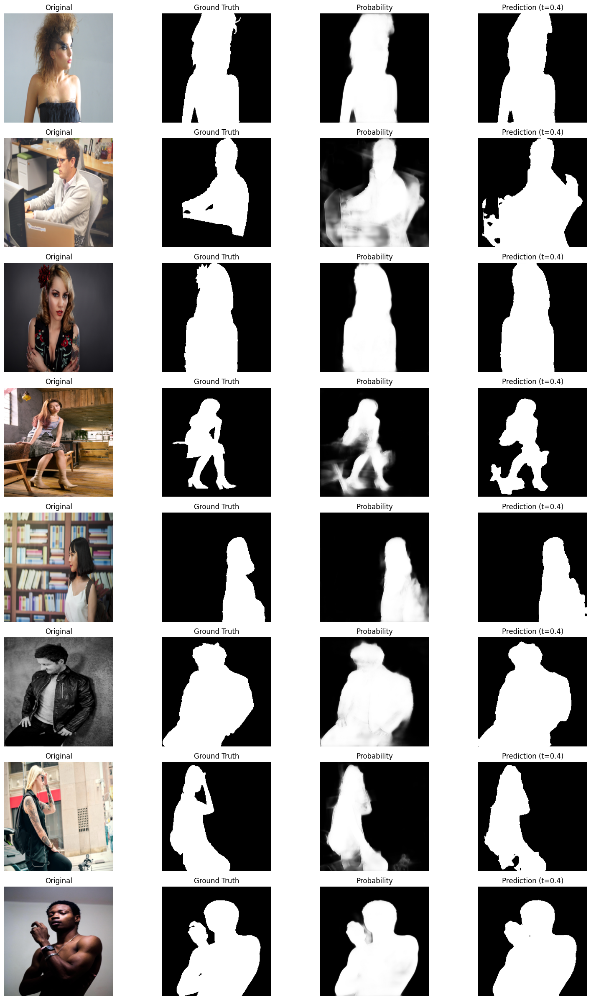

In [44]:
visualize_predictions(
    baseline_model,
    test_dataloader,
    device,
)

### + Residual ConvBlocks & Focal Loss (The "Specialist" Model)

While the baseline gets decent IoU, visual fidelity on tiny objects like fingers and watches is poor. We add Residual ConvBlocks and Focal Loss to penalize the model for ignoring complex boundaries.

In [15]:
res_model = BackgroundRemoval().to(device)

criterion = FocalDiceLoss()

optimizer = torch.optim.Adam(
    res_model.parameters(),
    lr=1e-3
)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='max', factor=0.5, patience=3
)

In [ ]:
train_losses = []
val_losses = []
epochs = 50
best_iou = 0

for epoch in range(epochs):
    print(f"Epoch: {epoch+1}: ")
    train_loss = train_step(res_model, train_dataloader, criterion, optimizer, device)

    val_loss, val_iou, val_dice = val_step(res_model, val_dataloader, criterion, device)
    scheduler.step(val_iou)

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    if val_iou > best_iou:
        best_iou = val_iou
        torch.save(
            {
                "epoch": epoch + 1,
                "model_state_dict": res_model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "scheduler_state_dict": scheduler.state_dict(),
                "train_losses": train_losses,
                "val_losses": val_losses,
                "val_iou": val_iou,
                "val_dice": val_dice,
            },
            "resdiual-connection-model.pth",
        )



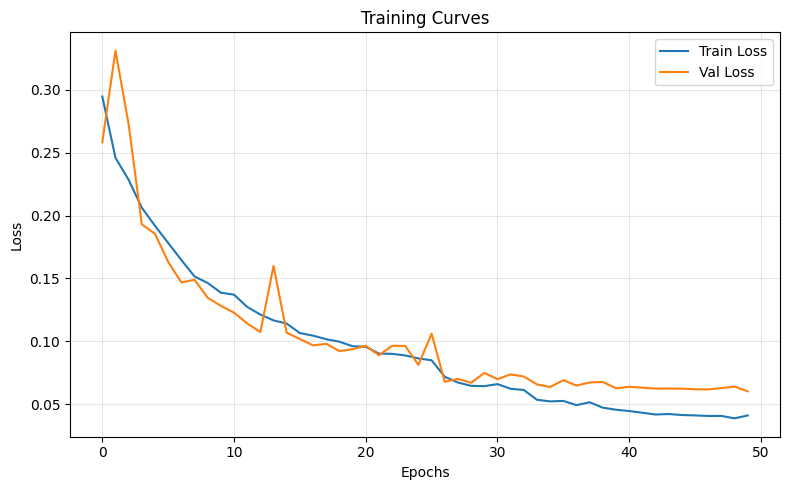

In [23]:
plot_training_curves("models/res_model.pth")

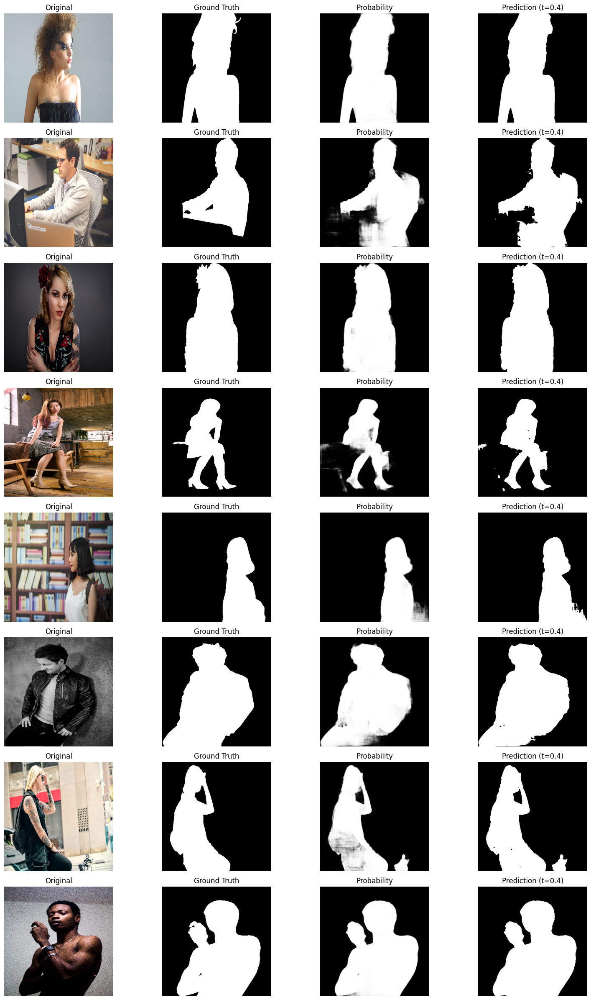

In [46]:
visualize_predictions(
    res_model,
    test_dataloader,
    device,
)

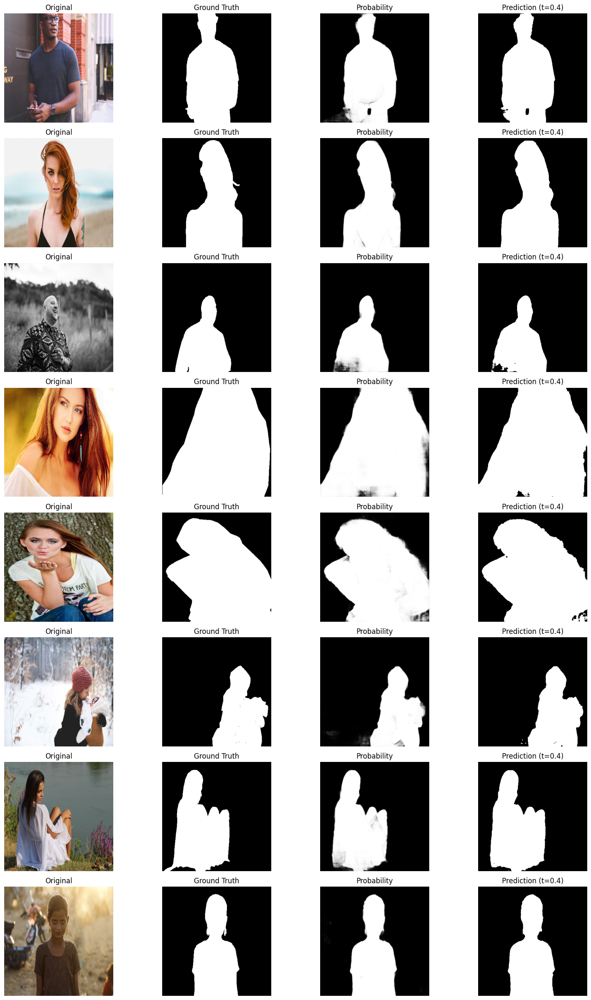

In [49]:
visualize_predictions(
    res_model,
    val_dataloader,
    device,
)

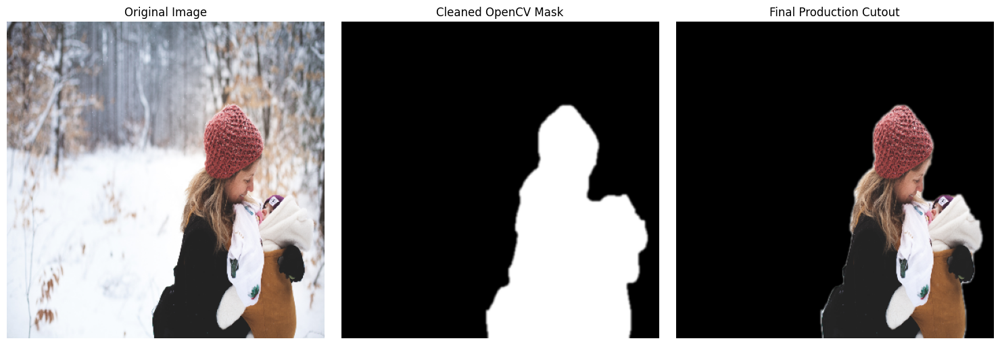

In [16]:
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def show_production_cutout(model, dataset, index=0):
    model.eval()
    
    # 1. Get image and raw mask from your dataset
    # Note: dataset[index] returns the augmented/resized tensor
    image_tensor, _ = dataset[index]
    
    # Add batch dimension and move to device
    x = image_tensor.unsqueeze(0).to(device)
    
    # 2. Get Raw Prediction
    with torch.inference_mode():
        logits = model(x)
        probs = torch.sigmoid(logits)
        raw_pred = (probs > 0.4).float().cpu() # Threshold
        
    # 3. Apply OpenCV Post-Processing (from your utils.py)
    # This cleans the mask and adds smooth blurred edges
    clean_mask = postprocess_mask(raw_pred)
    
    # 4. Prepare images for visualization
    # Convert image tensor back to numpy [H, W, C] for plotting
    original_img = image_tensor.permute(1, 2, 0).cpu().numpy()
    
    # Expand mask from [H, W] to [H, W, 1] so we can multiply it with the image
    clean_mask_3d = np.expand_dims(clean_mask, axis=-1)
    
    # 5. Create the Cutout (Original Image * Clean Mask)
    # The background becomes black (0) because mask is 0 there
    cutout = original_img * clean_mask_3d
    
    # 6. Plotting
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(original_img)
    plt.axis("off")
    
    plt.subplot(1, 3, 2)
    plt.title("Cleaned OpenCV Mask")
    plt.imshow(clean_mask, cmap='gray')
    plt.axis("off")
    
    plt.subplot(1, 3, 3)
    plt.title("Final Production Cutout")
    plt.imshow(cutout)
    plt.axis("off")
    
    plt.tight_layout()
    plt.show()



checkpoint = torch.load(
    "models/res_model.pth",
    map_location=device
)

res_model.load_state_dict(checkpoint["model_state_dict"])


show_production_cutout(res_model, val_dataset, index=5)

## 📉 The Bias-Variance Tradeoff & The Data Ceiling

During real-world testing of the Specialist model, I discovered a critical dataset bias: **Depth-of-Field Overfitting**. Because the training data consisted heavily of professional portraits, the network learned a shortcut: *"If a pixel is blurry, it's background. If it's sharp, it's foreground."*

### The "Anti-Lazy" Model (Generalist)
To fix this, we apply extreme augmentations (`A.Sharpen`, `A.GaussianBlur`, `A.CoarseDropout`) to destroy the blur shortcut and force the model to learn true human anatomy.

In [13]:
final_model = BackgroundRemoval().to(device)

criterion = FocalDiceLoss()

optimizer = torch.optim.Adam(
    final_model.parameters(),
    lr=1e-3
)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='max', factor=0.5, patience=3
)

In [ ]:
train_losses = []
val_losses = []
epochs = 60
best_iou = 0

for epoch in range(epochs):
    print(f"Epoch: {epoch+1}: ")
    train_loss = train_step(final_model, train_dataloader, criterion, optimizer, device)

    val_loss, val_iou, val_dice = val_step(final_model, val_dataloader, criterion, device)
    scheduler.step(val_iou)

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    if val_iou > best_iou:
        best_iou = val_iou
        torch.save(
            {
                "epoch": epoch + 1,
                "model_state_dict": final_model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "scheduler_state_dict": scheduler.state_dict(),
                "train_losses": train_losses,
                "val_losses": val_losses,
                "val_iou": val_iou,
                "val_dice": val_dice,
            },
            "final_model.pth",
        )



In [ ]:
checkpoint = torch.load(
    "models/final_model.pth",
    map_location=device
)

final_model.load_state_dict(checkpoint["model_state_dict"])

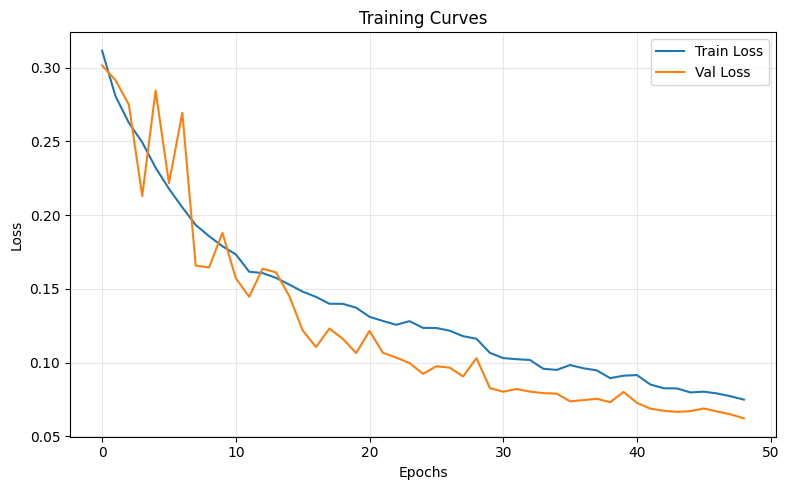

In [4]:
plot_training_curves("models/final_model.pth")

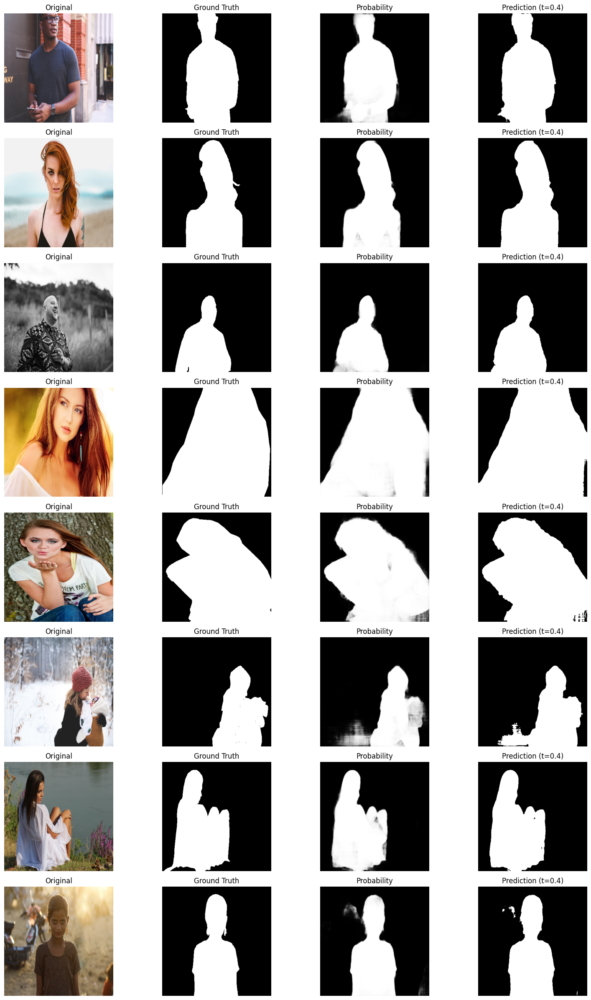

In [16]:
visualize_predictions(
    final_model,
    val_dataloader,
    device,
)

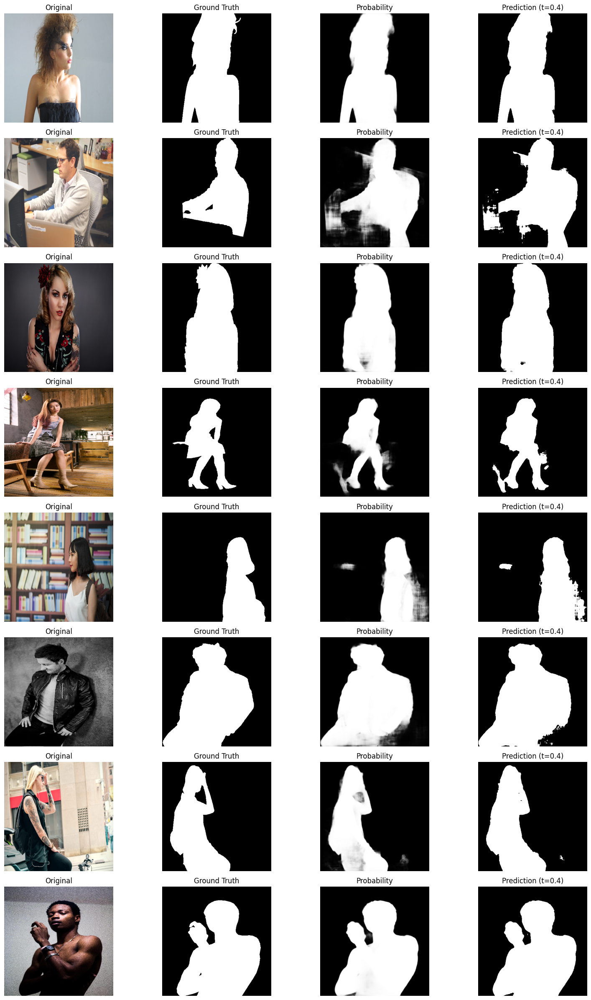

In [17]:
visualize_predictions(
    final_model,
    test_dataloader,
    device,
)

## ⚙️ Production Inference Pipeline

Raw Neural Networks rarely output perfect masks. To bridge the gap between academic metrics and a production-ready user experience, I engineered a Microservice Inference Pipeline for deployment:

1. **Test-Time Augmentation (TTA)**
2. **OpenCV Contour Filling**
3. **High-Res Alpha Blending**

## 🛑 Limitations & Future Work

Because this architecture was trained from scratch, it lacks prior contextual knowledge of the world. It will fail on Severe Occlusions.

**Next Steps:** Replace custom Encoder with a Transfer Learning approach (e.g., a `ResNet34` backbone pre-trained on ImageNet).